<a href="https://colab.research.google.com/github/naryst/AI-music-generation/blob/master/Mask_RCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install roboflow -q

In [4]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git' -q

  Preparing metadata (setup.py) ... done


In [5]:
import logging
import torch
from collections import OrderedDict
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.utils.events import EventStorage
from detectron2.modeling import build_model
import detectron2.utils.comm as comm
from detectron2.engine import default_argument_parser, default_setup, default_writers, launch
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)

from roboflow import Roboflow

from matplotlib import pyplot as plt
from PIL import Image

In [6]:
VERSION = 1

from roboflow import Roboflow
rf = Roboflow(api_key="i5a31149ZXb5vXFpPtOS")
project = rf.workspace("ds-sdvyu").project("aml_assignment2")
dataset = project.version(1).download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to aml_assignment2-1 in coco-segmentation:: 100%|██████████| 366/366 [00:00<00:00, 1287.01it/s]


In [7]:
register_coco_instances("dataset_train", {}, f"./aml_assignment2-{VERSION}/train/_annotations.coco.json", f"./aml_assignment2-{VERSION}/train/")
register_coco_instances("dataset_valid", {}, f"./aml_assignment2-{VERSION}/valid/_annotations.coco.json", f"./aml_assignment2-{VERSION}/valid/")
register_coco_instances("dataset_test", {}, f"./aml_assignment2-{VERSION}/test/_annotations.coco.json", f"./aml_assignment2-{VERSION}/test/")

WARNING [04/26 18:54:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/26 18:54:58 d2.data.datasets.coco]: Loaded 326 images in COCO format from ./aml_assignment2-1/train/_annotations.coco.json


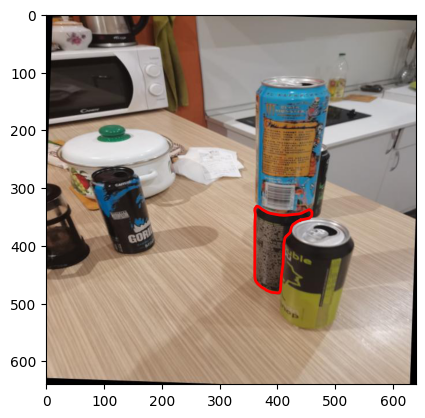

In [8]:
dataset_train = DatasetCatalog.get("dataset_train")
fig, ax = plt.subplots()
dataset_dict = random.choice(dataset_train)
im = Image.open(dataset_dict['file_name'])
ax.imshow(im)
for ann in dataset_dict['annotations']:
    for poly in ann['segmentation']:
        x = poly[0::2]
        y = poly[1::2]
        ax.plot(x,y, linewidth=2, color='red')

In [9]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",) #Train dataset registered in a previous cell
cfg.DATASETS.TEST = ("dataset_test",) #Test dataset registered in a previous cell
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 10000
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 # 2 classes of drinks and 1 superclass
cfg.TEST.EVAL_PERIOD = 0 # i will not evaluate model during training to decrease training time

PATIENCE = 300 #Early stopping will occur after N iterations of no imporovement in total_loss

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [10]:


def get_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky if-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, output_dir=output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        return CityscapesSemSegEvaluator(dataset_name)
    if evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    if evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, cfg, True, output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    if len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

def do_test(cfg, model):
    results = OrderedDict()
    for dataset_name in cfg.DATASETS.TEST:
        data_loader = build_detection_test_loader(cfg, dataset_name)
        evaluator = get_evaluator(
            cfg, dataset_name, os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
        )
        results_i = inference_on_dataset(model, data_loader, evaluator)
        results[dataset_name] = results_i
        if comm.is_main_process():
            logger.info("Evaluation results for {} in csv format:".format(dataset_name))
            print_csv_format(results_i)
    if len(results) == 1:
        results = list(results.values())[0]
    return results


logger = logging.getLogger("detectron2")
resume=False
model = build_model(cfg)
optimizer = build_optimizer(cfg, model)
scheduler = build_lr_scheduler(cfg, optimizer)

BEST_LOSS = np.inf

checkpointer = DetectionCheckpointer(
    model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
)
start_iter = (
    checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
)
prev_iter = start_iter
max_iter = cfg.SOLVER.MAX_ITER

periodic_checkpointer = PeriodicCheckpointer(
    checkpointer, cfg.SOLVER.CHECKPOINT_PERIOD, max_iter=max_iter
)

writers = default_writers(cfg.OUTPUT_DIR, max_iter) if comm.is_main_process() else []

# compared to "train_net.py", we do not support accurate timing and
# precise BN here, because they are not trivial to implement in a small training loop
data_loader = build_detection_train_loader(cfg)
logger.info("Starting training from iteration {}".format(start_iter))
patience_counter = 0
with EventStorage(start_iter) as storage:
    for data, iteration in zip(data_loader, range(start_iter, max_iter)):
        storage.iter = iteration
        try:
            loss_dict = model(data)
        except:
            continue
        losses = sum(loss_dict.values())
        assert torch.isfinite(losses).all(), loss_dict

        loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())
        if comm.is_main_process():
            storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
        scheduler.step()

        if (
            cfg.TEST.EVAL_PERIOD > 0
            and (iteration + 1) % cfg.TEST.EVAL_PERIOD == 0
            and iteration != max_iter - 1
        ):
            do_test(cfg, model)
            # Compared to "train_net.py", the test results are not dumped to EventStorage
            comm.synchronize()

        if iteration - start_iter > 5 and (
            (iteration + 1) % 20 == 0 or iteration == max_iter - 1
        ):
            for writer in writers:
                writer.write()
        periodic_checkpointer.step(iteration)
        
        if iteration > prev_iter:
            prev_iter = iteration
            if losses_reduced < BEST_LOSS:
                BEST_LOSS = losses_reduced
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter % 100 == 0:
                    print(f"Loss has not improved for {patience_counter} iterations")
                if patience_counter >= PATIENCE:
                    print(f"EARLY STOPPING")
                    break
                
do_test(cfg, model)


[04/26 18:55:00 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


WARNING [04/26 18:55:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/26 18:55:00 d2.data.datasets.coco]: Loaded 326 images in COCO format from ./aml_assignment2-1/train/_annotations.coco.json
[04/26 18:55:00 d2.data.build]: Removed 31 images with no usable annotations. 295 images left.
[04/26 18:55:00 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   Drinks   | 0            | Burn green | 245          |  Red Bool  | 308          |
|            |              |            |              |            |              |
|   total    | 553          |            |              |            |              |
[04/26 18:55:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[04/26 18:55:12 d2.utils.events]:  iter: 19  total_loss: 2.404  loss_cls: 1.496  loss_box_reg: 0.146  loss_mask: 0.6916  loss_rpn_cls: 0.02736  loss_rpn_loc: 0.006592     lr: 4.9953e-06  max_mem: 1766M
[04/26 18:55:28 d2.utils.events]:  eta: 2:08:20  iter: 39  total_loss: 2.214  loss_cls: 1.323  loss_box_reg: 0.1841  loss_mask: 0.6838  loss_rpn_cls: 0.0166  loss_rpn_loc: 0.004323     lr: 9.9902e-06  max_mem: 1769M
[04/26 18:55:35 d2.utils.events]:  eta: 1:04:09  iter: 59  total_loss: 1.944  loss_cls: 1.079  loss_box_reg: 0.1941  loss_mask: 0.6728  loss_rpn_cls: 0.01933  loss_rpn_loc: 0.007145     lr: 1.4985e-05  max_mem: 1769M
[04/26 18:55:43 d2.utils.events]:  eta: 1:04:32  iter: 79  total_loss: 1.654  loss_cls: 0.7592  loss_box_reg: 0.2165  loss_mask: 0.6516  loss_rpn_cls: 0.01782  loss_rpn_loc: 0.008682     lr: 1.998e-05  max_mem: 1769M
[04/26 18:55:51 d2.utils.events]:  eta: 1:03:55  iter: 99  total_loss: 1.388  loss_cls: 0.498  loss_box_reg: 0.2431  loss_mask: 0.6246  loss_rpn_cls

OrderedDict([('bbox',
              {'AP': 65.43158605752865,
               'AP50': 80.46229898519695,
               'AP75': 71.35003813505179,
               'APs': nan,
               'APm': 78.24597165598912,
               'APl': 64.08250825082509,
               'AP-Drinks': nan,
               'AP-Burn green': 69.45514061238397,
               'AP-Red Bool': 61.40803150267331}),
             ('segm',
              {'AP': 67.2225658592294,
               'AP50': 80.46229898519695,
               'AP75': 68.81025315496395,
               'APs': nan,
               'APm': 75.32413955681281,
               'APl': 67.13788878887888,
               'AP-Drinks': nan,
               'AP-Burn green': 69.07811560508279,
               'AP-Red Bool': 65.36701611337604})])

In [20]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [13]:
checkpointer.save("model_final")  # save to output dir

In [36]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

test_images = []
dataset_dicts = DatasetCatalog.get("dataset_test")
for d in dataset_dicts:    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    im = Image.fromarray(out.get_image()[:, :, ::-1])
    test_images.append(im)

[04/26 19:23:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [04/26 19:23:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/26 19:23:35 d2.data.datasets.coco]: Loaded 16 images in COCO format from ./aml_assignment2-1/test/_annotations.coco.json


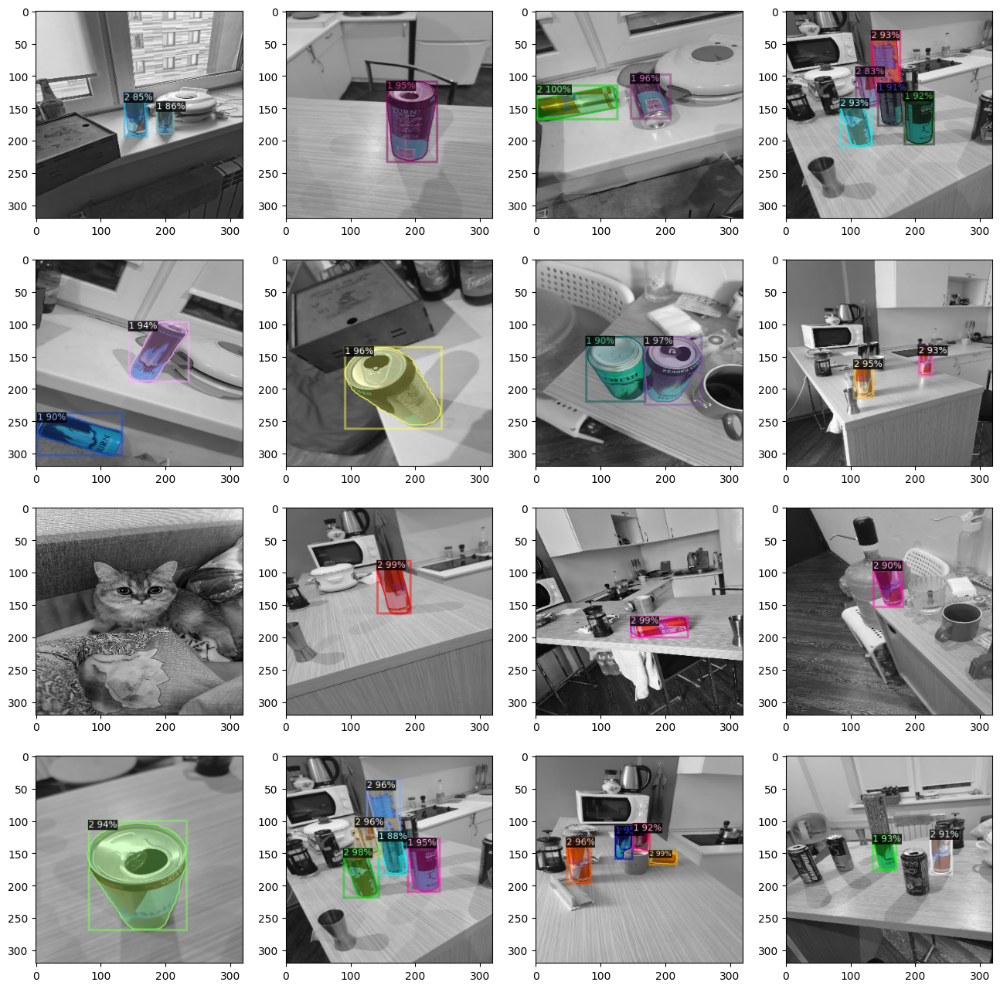

In [37]:
figsize = [16,16]
fig, ax = plt.subplots(nrows=4, ncols=4, figsize=figsize)

for i, axi in enumerate(ax.flat):
    img = test_images[i]
    axi.imshow(img)

plt.show()